# Prediction on Climate Change

#### De Jong Yeong (T00185309)

### Data Selection

Climate Change: Earth Surface Temperature Data contains global temperature since 1750 from [Kaggle](https://www.kaggle.com/berkeleyearth/climate-change-earth-surface-temperature-data). The raw data was originally compiled by the [Berkeley Earth](http://berkeleyearth.org/about/). The Berkeley Surface Temperature Study combines 1.6 billion temperature reports from 16 pre-existing archives. Kaggle repackaged the raw data from Berkeley Earth and included serveral files:

* GlobalTemperature.csv
* GlobalLandTemperatureByCountry.csv
* GlobalLandTemperatureByState.csv
* GlobalLandTemperatureByMajorCity.csv
* GlobalLandTempuresByCity.csv

Mark Kaufman stated that "Earth is now the warmest it's been in some 120,000 years in an artical posted in [Mashable](https://mashable.com/article/climate-change-2019-list/?europe=true) on March 16, 2019. Climate change disrupts national economies, human beings etc. dearly today and even more tomorrow. **Objective** of this project is to predict temperature based on historical data and analyzes future temperature (is there global warming?). The predicted values can be treated as an alert to bring climate action to the top of the international agenda.

The **GlobalLandTemperatureByCountry.csv** and **GlobalTemperature.csv** dataset will be used for the purpose of this project. This dataset contains the following columns:

**GlobalLandTemperatureByCountry.csv**
* dt - Date since 1753 up to 2013.
* AverageTemperature - Global average land temperature in Celcius Degree.
* AverageTemperatureUncertainty - The 95% confidence interval around the average.
* Country - Global country name.

**GlobalTemperature.csv**
* dt - Date since 1750 up to 2015
* LandAverageTemperature - Global average land temperature in degree celcius.
* LandAverageTemperatureUncertainty - The 95% confidence interval around the average.
* LandMaxTemperature - Global average maximum land temperature in celcius.
* LandMaxTemperatureUncertainty - The 95% confidence interval around the maximum land temperature.
* LandMinTemperature - Global average minimum land temperature in celcius.
* LandMinTemperatureUncertainty - The 95% confidence interval around the minimum land temperature.
* LandAndOceanAverageTemperature - Global average land and ocean temperature in celcius.
* LandAndOceanAverageTemperatureUncertainty - The 95% confidence interval around the global average land and ocean temperature.

**Note**: GlobalLandTemperatureByCountry.csv will only be used for data visualization.<br>
**Note**: GlobalTemperature.csv will be used for data visualization and time-series prediction to determine is there global warming?

*GlobalLandTemperatureByCountry.csv file is renamed to "global-land-temperature-by-country.csv" and GlobalTemperature.csv file is renamed to "global-temperature.csv" file.*<br>

In [1]:
# import modules.

import datetime
import scipy as sp
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# import data visualization module
import random
import plotly
from plotly import tools
import plotly.graph_objs as pgo
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# prediction
import warnings
import itertools
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

In [2]:
# set display options
pd.set_option('display.width', 300)
pd.set_option('precision', 3)
pd.set_option("display.max_rows", 300)
pd.set_option('display.height', 800)

# plotly offline
# reference: https://plot.ly/python/offline/
init_notebook_mode(connected=True)

Format Pandas DataFrame display style.

In [3]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px  black solid !important;
  color: black !important;
}
</style>

### Data Analyzing of Global Land Temperature by Country

Process of analyzing the global land temperature by country data with Python libraries for better understanding of the selected data.

In [4]:
# load in CSV dataset

filename='global-land-temperature-by-country.csv'
data = pd.read_csv(filename, low_memory=False, encoding='utf-8', index_col=False)

In [5]:
# no. of rows and columns
# 577462 rows and 4 columns before data preprocessing.

data.shape

(577462, 4)

In [6]:
# display first 5 data

data.head(5)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [7]:
# data type of each attribute
# values of temperature are in float and values of date-time and country are in object.

data.dtypes

dt                                object
AverageTemperature               float64
AverageTemperatureUncertainty    float64
Country                           object
dtype: object

In [8]:
# summary statistics of all attributes

data.describe(include='all')

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
count,577462,544811.000,545550.000,577462
unique,3239,NaN,NaN,243
top,1996-07-01,NaN,NaN,Andorra
freq,243,NaN,NaN,3239
mean,NaN,17.193,1.019,NaN
std,NaN,10.954,1.202,NaN
min,NaN,-37.658,0.052,NaN
25%,NaN,10.025,0.323,NaN
50%,NaN,20.901,0.571,NaN
75%,NaN,25.814,1.206,NaN


From the summary statistics above before data cleanzing, we can know that:

* 3239 unique date and "1986-04-01" has the most occurence (243).
* 243 unique countries and "Europe" has the most occurence (3239). 

In [9]:
# list of unique countries

countries = data.Country.unique()  
print(countries)

['Åland' 'Afghanistan' 'Africa' 'Albania' 'Algeria' 'American Samoa'
 'Andorra' 'Angola' 'Anguilla' 'Antarctica' 'Antigua And Barbuda'
 'Argentina' 'Armenia' 'Aruba' 'Asia' 'Australia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bahrain' 'Baker Island' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia'
 'Bonaire, Saint Eustatius And Saba' 'Bosnia And Herzegovina' 'Botswana'
 'Brazil' 'British Virgin Islands' 'Bulgaria' 'Burkina Faso' 'Burma'
 'Burundi' "Côte D'Ivoire" 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde'
 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Christmas Island' 'Colombia' 'Comoros'
 'Congo (Democratic Republic Of The)' 'Congo' 'Costa Rica' 'Croatia'
 'Cuba' 'Curaçao' 'Cyprus' 'Czech Republic' 'Denmark (Europe)' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Ethiopia' 'Europe'
 'Falkland Islands (Islas Malvinas)' 'Faroe Islands'
 'Federated States Of

#### Data Cleanzing and Data Transformation

Process which includes handling of noise or outliers; strategies for handling missing data fields; and collects information to mode or account for noise.

In [10]:
# remove duplicates data (country), e.g. Denmark and Denmark (Europe)
# congo is the same as congo (democratic republic of the)
# the '~' refers to 'not in'
# reference: https://stackoverflow.com/questions/19960077/how-to-implement-in-and-not-in-for-pandas-dataframe
# does not consider continent: Asia; Africa; North America; South America; Europe; Antarctica
duplicates = ['Denmark (Europe)', 'France (Europe)', 'Netherlands (Europe)', 'United Kingdom (Europe)', 
              'Congo (Democratic Republic Of The)', 'Asia', 'Africa', 'North America', 'South America',
              'Europe', 'Antarctica']

# keep data if country is not in duplicates
data = data[~data.Country.isin(duplicates)]  

In [11]:
# change dt column to date
data.rename(columns={'dt':'date'}, inplace=True)

# display first 5 data to verify
data.head(5)

,date,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [12]:
# use only date, AverageTemperature and Country
data = data[['date', 'AverageTemperature', 'Country']]

# display first 5 data
data.head(5)

,date,AverageTemperature,Country
0,1743-11-01,4.384,Åland
1,1743-12-01,NaN,Åland
2,1744-01-01,NaN,Åland
3,1744-02-01,NaN,Åland
4,1744-03-01,NaN,Åland


In [13]:
# summary statistics of all attributes after data cleanzing
data.describe(include='all')

,date,AverageTemperature,Country
count,549309,518550.000,549309
unique,3239,NaN,232
top,1996-07-01,NaN,Andorra
freq,232,NaN,3239
mean,NaN,17.503,NaN
std,NaN,10.943,NaN
min,NaN,-37.658,NaN
25%,NaN,10.601,NaN
50%,NaN,21.437,NaN
75%,NaN,25.939,NaN


Number that represents month are listed below:

* January - 1
* February - 2
* March - 3
* April - 4
<br>...
* November - 11
* December - 12

Transform data: column (unique country); row (unique date)

In [14]:
# split data based on unique country name
# reference: https://stackoverflow.com/questions/47769453/pandas-split-dataframe-to-multiple-by-unique-values-rows
# reference: https://pbpython.com/pandas-list-dict.html

countries = dict(tuple(data.groupby('Country')))
country = data.Country.unique()

# retrieves list of temperature for each country
# ensures that all array contains the same length
frames = []
for c in country:
    dat = countries[c]
    temp = dat['AverageTemperature']
    if len(temp) != 3239:  # value from summary table
        ext = []
        for i in range(3239-len(temp)):
            ext.append(np.NaN)  # append null values
        temp = np.append(temp, ext)  # append to temp
    frames.append((c, np.asarray(temp)))
    
# create new dataframes
df = pd.DataFrame.from_items(frames)

# insert date column
df.insert(0, 'date', data.date.unique())

# convert date column to datetime object
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

Copy transformed dataframe into new dataframe and set the date column as index.

**Interpolate** is a type of technique that is used to handle missing values in time series. It is used to estimate of a value within two known values in a sequence of values. The 'slinear' interpolation method uses the first oder spline method to interpolate data mentioned in [Stackoverflow discussion](https://stackoverflow.com/questions/27698604/what-do-the-different-values-of-the-kind-argument-mean-in-scipy-interpolate-inte).

References: [Handling Missing Values In Time Series](https://chrisalbon.com/machine_learning/preprocessing_dates_and_times/handling_missing_values_in_time_series/)

In [15]:
# copy into new dataframe for data visualization
dfi = df.copy(deep=True)

# set the date column as index
dfi.set_index('date', inplace=True)

# drop row and column if value is all null
dfi = dfi.dropna(how='all', axis=1)

# interpolate the data
dfi = dfi.interpolate(method='slinear')  # on column

# display
display(dfi)

,Åland,Afghanistan,Albania,Algeria,American Samoa,Andorra,Angola,Anguilla,Antigua And Barbuda,Argentina,...,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Virgin Islands,Western Sahara,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
1743-11-01,4.384,13.008,8.620,13.322,26.647,7.556,20.921,25.011,24.853,10.745,...,15.420,23.126,-5.145,24.613,19.539,24.787,18.247,19.886,20.931,22.187
1743-12-01,3.821,18.389,9.598,14.839,26.428,8.263,19.682,24.373,24.309,6.995,...,8.162,22.378,-3.027,24.670,19.797,24.027,19.068,21.641,22.380,23.538
1744-01-01,3.239,23.950,10.609,18.841,26.453,8.994,19.690,25.366,25.216,6.901,...,1.591,20.459,2.531,25.527,22.176,25.106,20.839,24.285,21.970,22.528
1744-02-01,2.657,26.877,11.619,22.061,26.811,9.725,19.698,26.037,26.037,9.097,...,-2.882,16.751,12.094,25.732,25.197,25.700,20.929,27.186,20.267,20.000
1744-03-01,2.112,24.938,12.564,27.104,26.435,10.408,19.705,26.725,26.608,11.316,...,-3.952,13.028,17.908,24.999,26.235,26.516,23.542,29.023,18.034,17.067
1744-04-01,1.530,18.981,13.575,32.289,26.191,11.139,21.757,27.652,27.451,13.818,...,-2.684,11.182,24.124,24.978,27.582,27.478,25.963,30.224,16.893,15.631
1744-05-01,6.702,13.428,14.782,32.692,25.981,12.264,22.279,28.549,28.266,17.251,...,1.828,10.768,26.083,24.957,27.047,28.409,26.325,30.320,16.943,15.719
1744-06-01,11.609,7.475,19.079,33.049,25.753,16.764,22.441,27.564,27.298,17.711,...,8.843,10.734,23.811,24.291,26.086,27.362,27.741,29.368,19.320,18.117
1744-07-01,15.342,7.000,21.706,31.650,25.744,19.179,22.221,27.223,26.853,21.160,...,15.724,12.475,17.448,24.391,24.889,26.966,26.885,28.093,22.034,20.987


In [16]:
# shape of transformed data
print(dfi.shape)

(3239, 232)


#### Data Visualization

In [17]:
# read plotly api key from text file (private)
api = open('api.txt').read()

# plotly credentials
plotly.tools.set_credentials_file(username='dejongyeong', api_key=api)

#### Monthy Malaysia and Ireland Average Land Temperate

In [18]:
# visualize temperature in Ireland and Malaysia (sample)
rand = dfi[['Ireland', 'Malaysia']]

# line colors
# reference: http://ksrowell.com/blog-visualizing-data/2012/02/02/optimal-colors-for-graphs/
color = ['#%02x%02x%02x' % (57, 106, 177), '#%02x%02x%02x' % (204, 37, 41)]

# plot graph
# reference: https://plot.ly/python/time-series/
graph = []
for i in range(2):  # len to rand
    graph.append(pgo.Scatter(x=df['date'], y=rand[rand.columns[i]], name=rand.columns.values[i], 
                             line=dict(color=color[i]), opacity=0.9))

# plot legend and  title
# reference: https://plot.ly/python/figure-labels/
title = 'Monthly Average Land Temperature in Ireland and Malaysia'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date',
                                          tick0=0, range=[df['date'].iloc[0],df['date'].iloc[-1]]))

# plot
iplot(pgo.Figure(data=graph,layout=layout))

The graph above illustrates the monthly average land temperature of Malaysia and Ireland from November 1743 to January 2013. The monthly average land temperature in **Ireland** shows significant difference from Nov 1740 to May 2013. It was reported that the lowest average land temperature was 0.267°C in Jan 1814 and the highest temperature was 17.979°C in Jul 1757. In contrast, the difference of monthly average land temperature in **Malaysia** is insignificant. It was reported that the lowest average land temperature was 23.86°C in Jul 1932 and the highest temperature was 28.26 in Mar 1917. 

*The monthly average land temperature for Malaysia country contains data up to Jul 1932 only* 

#### Average Temperature in each Season

Spring: March to May<br>
Summer: June to August<br>
Autumn: September to November<br>
Winder: December to February

[Reference](https://www.kaggle.com/hubery/some-visualizations-for-climate-change)

In [19]:
# season function
def season(month):
    if month>=6 and month<=8:
        return 'summer'
    if month>=9 and month <=11:
        return 'autumn'
    if month>=3 and month <=5:
        return 'spring'
    return 'winter'

# season array
spring = []
summer = []
winter = []
autumn = []
        
# copy into new dataframe for data visualization
dfa = dfi.copy(deep=True) 

# new year, month and season column
dfa['month'] = dfa.index.month
dfa['year'] = dfa.index.year
dfa['season'] = dfa['month'].apply(season)

# year range
year_range = range(dfa['year'].min(), dfa['year'].max()+1)

# unique countries
ctries = dfi.columns

for year in year_range:
    years = dfa[dfa['year'] == year]  # group into year
    for ctr in range(len(ctries)):
        spring.append(round(years[years['season'] == 'spring'][ctries[ctr]].mean(skipna=True), 2))  # skipna when calculating mean
        summer.append(round(years[years['season'] == 'summer'][ctries[ctr]].mean(skipna=True), 2))
        autumn.append(round(years[years['season'] == 'autumn'][ctries[ctr]].mean(skipna=True), 2))
        winter.append(round(years[years['season'] == 'winter'][ctries[ctr]].mean(skipna=True), 2))

In [20]:
# convert to np array
spring = np.array(spring)
summer = np.array(summer)
autumn = np.array(autumn)
winter = np.array(winter)

# remove nan values
spring = spring[~np.isnan(spring)]
summer = summer[~np.isnan(summer)]
autumn = autumn[~np.isnan(autumn)]
winter = winter[~np.isnan(winter)]

# convert to np array
year_range = np.asarray(year_range)

# line colors
# reference: http://ksrowell.com/blog-visualizing-data/2012/02/02/optimal-colors-for-graphs/
color = ['#%02x%02x%02x' % (57, 106, 177), '#%02x%02x%02x' % (204, 37, 41), '#%02x%02x%02x' % (218, 124, 48),
         '#%02x%02x%02x' % (62, 150, 81)]

# plot - spring, summer, autumn, winter
# scattergl to draw large dataset
scatter = []
scatter.append(pgo.Scattergl(x=year_range, y=spring, name='spring', line=dict(color=color[0]), opacity=0.9, mode='lines'))  # spring - first color
scatter.append(pgo.Scattergl(x=year_range, y=summer, name='summer', line=dict(color=color[1]), opacity=0.9, mode='lines'))  # summer - second color
scatter.append(pgo.Scattergl(x=year_range, y=autumn, name='autumn', line=dict(color=color[2]), opacity=0.9, mode='lines'))  # autumn - third color
scatter.append(pgo.Scattergl(x=year_range, y=winter, name='winter', line=dict(color=color[3]), opacity=0.9, mode='lines'))  # winter - fourth color

# plot legend and  title
# reference: https://plot.ly/python/figure-labels/
title = 'Average Land Temperature in each Season vs. Date'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date',
                                          tick0=0, range=[df['date'].iloc[0],df['date'].iloc[-1]]))

# plot
iplot(pgo.Figure(data=scatter,layout=layout), filename='average-temperature-each-season')

The graph above illustrates the average land temperature based on each season (spring, summer, autumn and winter) from Jan 1744 to Jan 2013. It can be seen that:

* Spring: The lowest temperature is -21.51°C in Jan 1785 and the highest temperature is 33.22°C in Jan 1969.
* Summer: The lowest temperature is -13.18°C in Jan 1829 and the highest temperature is 34.39°C in Jan 1860.
* Autumn: The lowest temperature is -29.92°C in Jan 1829 and the highest temperature is 31.92°C in Jan 1896.
* Winter: The lowest temperature is -32.37°C in Jan 1829 and the highest temperature is 31.15°C in Jan 1896.

Winter season shows the most significant difference between the lowest temperature and the highest temperature. This is because some of the countries have summer all year-round with high temperature even in the winter season. 


*The graph illustrated above uses the interpolated dataset. Null values are removed when aggregating temperature based on each season before plotting the graph*

#### Average Temperature in Countries

Let's illustrate the average land temperature for each country in a 3D globe from the interpolated data.  

Reference: [Map of Temperatures in Countries](https://www.kaggle.com/reddymanoj/map-of-temperatures-and-analysis-of-global-warming)

In [21]:
# unique countries
uniq_ctr = dfi.columns

#calculate the mean temperature for each country
agg_temp = []
for ctr in uniq_ctr:
    agg_temp.append(round(np.nanmean(dfi[ctr].values), 3))  # aggregate and skip null values
    
# data
map_data = [dict(type='choropleth', locations=uniq_ctr, z=agg_temp, locationmode='country names', 
                 marker= dict(line=dict(color='rgb(0,0,0)', width=1)), 
                              colorbar=dict(tickprefix='', title='Average Temperature (°C)'))]

# layout
layout = dict(title='Countries Mean Average Land Temperature',
              geo=dict(showframe=False, showocean=True, oceancolor='rgb(0,255,255)',
                       projection=dict(type='orthographic',rotation=dict(lon=60, lat=10),), 
                       lonaxis=dict(showgrid=True, gridcolor='rgb(102,102,102)'),
                       lataxis=dict(showgrid=True, gridcolor='rgb(102,102,102)')),)

# figure
figure = dict(data=map_data, layout=layout)

# offline plot
iplot(figure)

The graph above illustrates the average land temperature (°C) of each country from Nov 1743 to Jan 2013. **Greenland** has the lowest temperature (-18.587°C) due to its northerly location and is surrounded by cold ocean currents. Countries lies within the intertropical zone between the Tropic of Cancer and the Tropic of Capricorn has highest temperature to other counties.  

[Geographic Terms Reference:](https://www.wikiwand.com/en/Tropics) 

*White section in the above illustrated graph indicates no value for that country.*

#### Average Land Temperature Difference

Let's compute the min-max temperature difference and visualize it.

In [22]:
# unique countries
uniq_ctr = dfi.columns

# min-max difference: subtract min value from max value (ignore null value)
min_max = []
for ctr in uniq_ctr:
    max = np.nanmax(dfi[ctr].values)
    min = np.nanmin(dfi[ctr].values)
    min_max.append(round(max - min, 2))  # subtract min from max, round to 2 decimal
    
# data
diff_data = [pgo.Bar(x=uniq_ctr, y=min_max)]

# title and legend name
layout = pgo.Layout(title='Average Land Temperature Min-Max Difference vs. Countries', yaxis=dict(title='Temperature °C'))

# plot
iplot(pgo.Figure(data=diff_data,layout=layout))

The graph above illustrates the average land temperature min-max difference for each country. It can be seen that **Kazakhstan** has the highest temperature min-max difference (49.16°C) and **Federated States of Micronesia** has the lowest temperature min-max difference (2.98°C).

### Data Analyzing of Global Temperature

Process of analyzing the global temperature by country data with Python libraries for better understanding of the selected data. It is a monthly earth temperature.

In [23]:
# load in CSV dataset
filename='global-temperature.csv'
lo = pd.read_csv(filename, low_memory=False, encoding='utf-8', index_col=False)

# display first 5 data
lo.head(5)

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
# remove null values from the loaded dataset
lo = lo.dropna(how='any')
print(lo.isnull().sum().sum())  # expected 0

0


In [25]:
# print first 5 data from not-null dataset
display(lo.head(5))

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
1200,1850-01-01,0.749,1.105,8.242,1.738,-3.206,2.822,12.833,0.367
1201,1850-02-01,3.071,1.275,9.970,3.007,-2.291,1.623,13.588,0.414
1202,1850-03-01,4.954,0.955,10.347,2.401,-1.905,1.410,14.043,0.341
1203,1850-04-01,7.217,0.665,12.934,1.004,1.018,1.329,14.667,0.267
1204,1850-05-01,10.004,0.617,15.655,2.406,3.811,1.347,15.507,0.249


Date time starts from 1850 instead of 1750 after null values were removed from loaded dataset.

In [26]:
# summary statistics of all attributes after data cleanzing
lo.describe(include='all')

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
count,1992,1992.000,1992.000,1992.000,1992.000,1992.000,1992.000,1992.000,1992.000
unique,1992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2000-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,8.572,0.277,14.351,0.480,2.744,0.432,15.213,0.129
std,NaN,4.263,0.224,4.310,0.583,4.156,0.446,1.274,0.074
min,NaN,0.404,0.034,5.900,0.044,-5.407,0.045,12.475,0.042
25%,NaN,4.430,0.100,10.212,0.142,-1.335,0.155,14.047,0.063
50%,NaN,8.850,0.230,14.760,0.252,2.950,0.279,15.251,0.122
75%,NaN,12.858,0.347,18.452,0.539,6.779,0.458,16.396,0.151


In [27]:
# reset index
lo = lo.reset_index(drop=True)

# change dt column to date
lo.rename(columns={'dt':'date'}, inplace=True)

# convert date column to datetime object
lo['date'] = pd.to_datetime(lo['date'], format='%Y-%m-%d')

# set the date column as index
lo.set_index('date', inplace=True)

# print first 5 data
display(lo.head(5))

,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
date,,,,,,,,
1850-01-01,0.749,1.105,8.242,1.738,-3.206,2.822,12.833,0.367
1850-02-01,3.071,1.275,9.970,3.007,-2.291,1.623,13.588,0.414
1850-03-01,4.954,0.955,10.347,2.401,-1.905,1.410,14.043,0.341
1850-04-01,7.217,0.665,12.934,1.004,1.018,1.329,14.667,0.267
1850-05-01,10.004,0.617,15.655,2.406,3.811,1.347,15.507,0.249


In [28]:
# understand shape of cleaned dataset
print(lo.shape)  # 1992 rows and 9 columns.

(1992, 8)


#### Data Visualization

Let's visualize the distributions of Global Temperature with the use of boxplots.

In [29]:
# visualize distributions and outliers with boxplots
# reference: https://plot.ly/python/box-plots/
box = []
for i in range(len(lo.iloc[0:8])):  # all columns
    box.append(pgo.Box(x=lo.values[i], name=lo.columns.values[i]))

# title and legend name
layout = pgo.Layout(title='Distribution of Global Temperature', xaxis=dict(title='Temperature (°C)'))

# plot
iplot(pgo.Figure(data=box,layout=layout))

The graph above illustrates the distribution of global temperature in terms of land average temperature, maximum land temperature, minimum land temperature, land and ocean average temperature and its uncertainty. Uncertainty is the 95% confidence interval of these temperature. Illustrated boxplot shows the minimum values, 25th percentile, 75th percentile, maximum values and outliers. We can see that no outliers (represented by dot) is presented. 

#### Global Land Average Temperature and its 95% Confidence Interval from 1950 to 2015

Let's visualize the global land average temperature and its uncertainty by calculating its upper limit and lower limit.

In [174]:
# visualize global land average temperature and its 95% CI from 1950 to 2015
land_temp = lo['1950':]['LandAverageTemperature']
land_temp_ci = lo['1950':]['LandAverageTemperatureUncertainty']

# calculate upper and lower limit
upper = np.array(land_temp) + np.array(land_temp_ci)  # upper limit
lower = np.array(land_temp) - np.array(land_temp_ci)  # lower limit

# plot
data = []
data.append(pgo.Scatter(x=lo['1950':].index, y=upper, fill=None, mode='lines', name='upper limit', line=dict(color='#%02x%02x%02x' % (218, 124, 48))))
data.append(pgo.Scatter(x=lo['1950':].index, y=lower, fill='tonexty', mode='lines', name='lower limit', line=dict(color='#%02x%02x%02x' % (218, 124, 48))))
data.append(pgo.Scatter(x=lo['1950':].index, y=land_temp, mode='lines', name='gloabal land average temperature', line=dict(color='#%02x%02x%02x' % (57, 106, 177)))) 

# title and legend name
title = 'Global Land Average Temperature and its 95% Confidence Interval from 1950 to 2015'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date', tick0=0))

# plot
iplot(pgo.Figure(data=data,layout=layout))

The graph above illustrates the average global land temperature (°C) and its 95% confidence interval by calculating its upper limit and lower limit. The illustrated graph shows a seasonal fluctuation on the global land average temperature. This is because the global land average temperature was recorded based on seasonal temperature in each country. Countries lies within the intertropical zone between the Tropic of Cancer and the Tropic of Capricorn has highest temperature compared to other counties.

 #### Global Land and Ocean Temperature and its 95% Confidence Interval from 1950 to 2015

Let's visualize the global land and ocean average temperature and its 95% confidence interval by calculating its upper limit and lower limit.

In [173]:
# visualize global land and ocean average temperature and its 95% CI from 1950 to 2015
lo_temp = lo['1950':]['LandAndOceanAverageTemperature']
lo_temp_ci = lo['1950':]['LandAndOceanAverageTemperatureUncertainty']

# calculate upper and lower limit
upper = np.array(lo_temp) + np.array(lo_temp_ci)  # upper limit
lower = np.array(lo_temp) - np.array(lo_temp_ci)  # lower limit

# plot
data = []
data.append(pgo.Scatter(x=lo['1950':].index, y=upper, fill=None, mode='lines', name='upper limit', line=dict(color='#%02x%02x%02x' % (218, 124, 48))))
data.append(pgo.Scatter(x=lo['1950':].index, y=lower, fill='tonexty', mode='lines', name='lower limit', line=dict(color='#%02x%02x%02x' % (218, 124, 48))))
data.append(pgo.Scatter(x=lo['1950':].index, y=lo_temp, mode='lines', name='gloabal land and ocean average temperature', line=dict(color='#%02x%02x%02x' % (57, 106, 177)))) 

# title and legend name
title = 'Global Land and Ocean Average Temperature and its 95% Confidence Interval from 1950 to 2015'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date', tick0=0))

# plot
iplot(pgo.Figure(data=data,layout=layout))

The graph above illustrates the average global land and ocean temperature (°C) and its 95% confidence interval by calculating its upper limit and lower limit. The illustrated graph shows a seasonal fluctuation on the global land and ocean average temperature. This is because the global land and ocean average temperature was recorded based on seasonal temperature in each country. Countries lies within the intertropical zone between the Tropic of Cancer and the Tropic of Capricorn has highest temperature compared to other counties.

### Time Series Prediction and Analysis

Prediction of global land and ocean average temperature based on historical data. The 95% confidence interval of global land and ocean average temperature will not be considered when performing time series prediction.

In [32]:
# use only date index and global land and ocean average temperature
landocean = lo[['LandAndOceanAverageTemperature']]

# display first 5 data
display(landocean.head(5))

,LandAndOceanAverageTemperature
date,
1850-01-01,12.833
1850-02-01,13.588
1850-03-01,14.043
1850-04-01,14.667
1850-05-01,15.507


Let's visualized the decomposed time series. Time-Series Decomposition allows to decompose time series into three distinct components, which are trend, seasonality, and noise (residual). 

* **Trend**: The inceasing or decreasing value in the series.
* **Seasonality**: The repeating short-term cycle in the series.
* **Noise**: The random variation in the series.

Model of Time-Series Prediction:

* **Additive**: It is linear where changes over time are consistently made by the same amount (straight line). It has the same frequency (width of cycles) and amplitude (height of cycles).
* **Multiplicative**: It is non-linear, like quadratic or exponential where changes are increase or decrease over time (curved line). It has an inceasing or decreasing frequency and/or amplitude over time.


References: [An End-to-End Project on Time Series Analysis and Forecasting with Python](https://towardsdatascience.com/an-end-to-end-project-on-time-series-analysis-and-forecasting-with-python-4835e6bf050b)<br>
References: [Time Series Decomposition](https://machinelearningmastery.com/decompose-time-series-data-trend-seasonality/)

In [33]:
# year range
year_range = landocean.index.year.unique() 

# visualize decomposed time series
decompose = sm.tsa.seasonal_decompose(landocean, model='additive')

# line colors
# reference: http://ksrowell.com/blog-visualizing-data/2012/02/02/optimal-colors-for-graphs/
color = ['#%02x%02x%02x' % (57, 106, 177), '#%02x%02x%02x' % (204, 37, 41), '#%02x%02x%02x' % (218, 124, 48), '#%02x%02x%02x' % (62, 150, 81)]

# plot - observed, trend, seasonal, residual/noise
observed = pgo.Scatter(x=year_range, y=decompose.observed['LandAndOceanAverageTemperature'], name='observed', line=dict(color=color[0]), opacity=0.9, mode='lines')  # observed - first color
trend = pgo.Scatter(x=year_range, y=decompose.trend['LandAndOceanAverageTemperature'], name='trend', line=dict(color=color[1]), opacity=0.9, mode='lines')  # trend - second color
seasonal = pgo.Scatter(x=year_range, y=decompose.seasonal['LandAndOceanAverageTemperature'], name='seasonal', line=dict(color=color[2]), opacity=0.9, mode='lines')  # seasonal - third color
resid = pgo.Scatter(x=year_range, y=decompose.resid['LandAndOceanAverageTemperature'], name='resid', line=dict(color=color[3]), opacity=0.9, mode='lines')  # residual/noise - fourth color

# subplots
# reference: https://plot.ly/python/subplots/
fig = tools.make_subplots(rows=4, cols=1)

fig.append_trace(observed, 1, 1)  # row 1 col 1
fig.append_trace(trend, 2, 1)  # row 2 col 1
fig.append_trace(seasonal, 3, 1)  # row 3 col 1
fig.append_trace(resid, 4, 1)  # row 4 col 1

# title and legend name
fig['layout'].update(title='Time Series Decomposition Visualization')
fig['layout']['xaxis4'].update(title='Date')

fig['layout']['yaxis1'].update(title='Observed')
fig['layout']['yaxis2'].update(title='Trend')
fig['layout']['yaxis3'].update(title='Seasonal')
fig['layout']['yaxis4'].update(title='Residual')


# plot
iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]
[ (4,1) x4,y4 ]



#### ARIMA Model

ARIMA is an acronym that stands for **A**uto**R**egressive **I**ntegration **M**oving **A**verage. It is a class of statistical models that is used to analyze and forecast time-series data. Description of ARIMA are as follows:
* **AR** (AutoRegressive): A model that uses the dependent relationshop between an observation and a number of lagged observations.
* **I** (Integration): Use of differencing of raw observations, e.g. substract observertion from observation at previous time step to make time series stationary.
* **MA** (Moving Average): A model that uses the dependency between an observation and a residual error from a moving average model applied to lagged observations.

The ARIMA forecasting equation for a stationary time series is a linear equation, in which predictors consist of *lags of the dependent variable and/or lags of the forecast errors*, which is:

**<center>Predicted value of Y = a constant AND/OR a weighted sum of one ore more recent values of Y AND/OR a weighted sum of one or more recent values of the errors.</center>**

A non-seasonal ARIMA model is classified as an **ARIMA(p,d,q)(P,D,Q)m** where parameters are substituted with integer values to quickly indicate the specific model being used. The parameters of ARIMA model are defined as follows:

* **p**: Number of lag observations included in the model, also known as lag order.
* **d**: Number of times that raw observations are differenced, also known as degree or differencing.
* **q**: Size of moving average windown, also known as order of moving average.
* **m**: refers to number of periods in each season.
* **(P,D,Q)**: represents the (p,d,q) for seasonal part for time series.

Thus, the general forecasting equation in terms of y is as follows:

\begin{equation*}
\hat{y}_{t} = \mu + \phi_{1}y_{t-1} + ... + \phi_{p}y_{t-p} - \theta_{1}e_{t-1} - ... - \theta_{q}e_{t-q}
\end{equation*}


Reference: [ARIMA Model](https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/)<br>
Reference: [ARIMA Model: nonseasonal models](https://people.duke.edu/~rnau/411arim.htm#pdq)<br>
Reference: [Time Series Forecasting ARIMA models](https://towardsdatascience.com/time-series-forecasting-arima-models-7f221e9eee06)

In [34]:
# ARIMA(p, d, q) notation - seasonality, trend, noise
# define the d and q parameters to take any value between 0 and 1
d = q = range(0, 2)

# define the p parameters to take any value between 0 and 3
p = range(0, 4)  

# generate all different combinations of p, q, and q triplets
pdq = list(itertools.product(p, d, q))

m = 12  # periodicticity of the time series

# generate all different combinations of seasonal p, q, and q triplets
seasonal = [(x[0], x[1], x[2], m) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


The *SARIMAX* model from *statsmodels.tsa.statespace.sarimax* returns values for Akaike Information Criterion (AIC) and Bayes Information Criterion (BIC) that can be minimized to select the best fitting model. **AIC** value estimates the information lost when a given model is used to represent the process that generates the data. It deals with the trade-off between goodness of git of the model and the complexity of the model itself. Goal is to use a *grid search* method to find optimal set of parameters that yields the best performance.

Reference: [Time Series Analysis with ARIMA](https://github.com/gmonaci/ARIMA/blob/master/time-series-analysis-ARIMA.ipynb)<br>
Tutorial: [CO2 Emission Forecast with Python (Seasonal ARIMA)](https://www.kaggle.com/berhag/co2-emission-forecast-with-python-seasonal-arima)

In [35]:
# time-series train-test split: 80% train 20% test
# references: https://machinelearningmastery.com/backtest-machine-learning-models-time-series-forecasting/
X = landocean
train_size = int(len(X) * 0.8)

# train test
train, test = X[0:train_size], X[train_size:len(X)]

# print value
print('Observe: {}\nTrain: {}\nTest: {}'.format(len(X), len(train), len(test)))

Observe: 1992
Train: 1593
Test: 399


**NOTE**: The exploration of the combinations of SARIMAX parimeters tooks an execution time of 1 hour (estimation).

In [36]:
# filter/ignore warnings
warnings.filterwarnings('ignore')

aic = []
sarimax_model = []
for param in pdq:
    for param_seasonal in seasonal:
        try:
            mod = sm.tsa.statespace.SARIMAX(train, order=param, seasonal_order=param_seasonal, enforce_stationary=False, enforce_invertibility=False)
            
            # fit model
            results = mod.fit()
            
            # output
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
            
            # append results
            aic.append(results.aic)
            sarimax_model.append([param, param_seasonal])
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:13182.553638318721
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:11063.496621006221
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:-596.3837639756305
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:-1188.0977251334325
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:-888.8137070786283
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:-1210.2930834608999
ARIMA(0, 0, 0)x(2, 1, 0, 12)12 - AIC:-1005.383655646074
ARIMA(0, 0, 0)x(2, 1, 1, 12)12 - AIC:-1208.3077026948808
ARIMA(0, 0, 0)x(3, 1, 0, 12)12 - AIC:-1091.8639747119464
ARIMA(0, 0, 0)x(3, 1, 1, 12)12 - AIC:-1207.1165352905605
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:11019.892719623476
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:8933.375083090194
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:-1017.275489497847
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:-1739.4463476280189
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:-1399.065289718681
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:-1743.2998847199146
ARIMA(0, 0, 1)x(2, 1, 0, 12)12 - AIC:-1525.7494838296202
ARIMA(0, 0, 1)x(2, 1, 1, 12)12 - AIC:-174

ARIMA(2, 1, 1)x(3, 1, 0, 12)12 - AIC:-1898.306215260215
ARIMA(2, 1, 1)x(3, 1, 1, 12)12 - AIC:-2173.0960013871336
ARIMA(3, 0, 0)x(0, 0, 0, 12)12 - AIC:829.0112976246662
ARIMA(3, 0, 0)x(0, 0, 1, 12)12 - AIC:702.1031837348943
ARIMA(3, 0, 0)x(0, 1, 0, 12)12 - AIC:-1253.2485595005705
ARIMA(3, 0, 0)x(0, 1, 1, 12)12 - AIC:-2156.7906386214436
ARIMA(3, 0, 0)x(1, 1, 0, 12)12 - AIC:-1703.5164433271605
ARIMA(3, 0, 0)x(1, 1, 1, 12)12 - AIC:-2155.092654098358
ARIMA(3, 0, 0)x(2, 1, 0, 12)12 - AIC:-1855.0494270211595
ARIMA(3, 0, 0)x(2, 1, 1, 12)12 - AIC:-2155.8488143089994
ARIMA(3, 0, 0)x(3, 1, 0, 12)12 - AIC:-1930.25067843224
ARIMA(3, 0, 0)x(3, 1, 1, 12)12 - AIC:-2153.849320967236
ARIMA(3, 0, 1)x(0, 0, 0, 12)12 - AIC:866.8417964133695
ARIMA(3, 0, 1)x(0, 0, 1, 12)12 - AIC:768.1658217228869
ARIMA(3, 0, 1)x(0, 1, 0, 12)12 - AIC:-1254.8536057356685
ARIMA(3, 0, 1)x(0, 1, 1, 12)12 - AIC:-2201.722375407523
ARIMA(3, 0, 1)x(1, 1, 0, 12)12 - AIC:-1715.8964172946198
ARIMA(3, 0, 1)x(1, 1, 1, 12)12 - AIC:-2199.91

In [37]:
#determine the smallest AIC and consider this to be optimal option out of all the parameter combinations.
print('Smaller AIC is {} for model SARIMAX{}x{}'.format(np.amin(aic), sarimax_model[aic.index(np.amin(aic))][0], sarimax_model[aic.index(np.amin(aic))][1]))

Smaller AIC is -2203.692405627316 for model SARIMAX(2, 0, 1)x(0, 1, 1, 12)


The SARIMAX(2, 0, 1)x(0, 1, 1, 12) yields the lowest AIC value of -2203.692405627316 and will be consider this to be an optimal option out of all the parameter combinations.

In [175]:
# let's fit the ARIMA model
order = sarimax_model[aic.index(np.amin(aic))][0]
seasonal_order = sarimax_model[aic.index(np.amin(aic))][1]
mod = sm.tsa.statespace.SARIMAX(landocean, order=order, seasonal_order=seasonal_order, enforce_stationary=False, enforce_invertibility=False)

results = mod.fit()

# display summary results
display(results.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:     LandAndOceanAverageTemperature   No. Observations:                 1992
Model:             SARIMAX(2, 0, 1)x(0, 1, 1, 12)   Log Likelihood                1444.360
Date:                            Fri, 26 Apr 2019   AIC                          -2878.719
Time:                                    04:48:18   BIC                          -2850.765
Sample:                                01-01-1850   HQIC                         -2868.450
                                     - 12-01-2015                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3168      0.035     37.378      0.000       1.248       1.386
ar.L2         -0.3314      0.032    -10.224      0.000      -0.395      -0.268
ma.L1         -0.7775      0.027    -28.310      0.000      -0.831      -0.724
ma.S.L12      -0.9556      0.009   -106.094      0.000      -0.973      -0.938
sigma2         0.0134      0.000     39.219      0.000       0.013       0.014
===================================================================================
Ljung-Box (Q):                       53.45   Jarque-Bera (JB):               123.23
Prob(Q):                              0.08   Prob(JB):                         0.00
Heteroskedasticity (H):               0.51   Skew:                             0.03
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

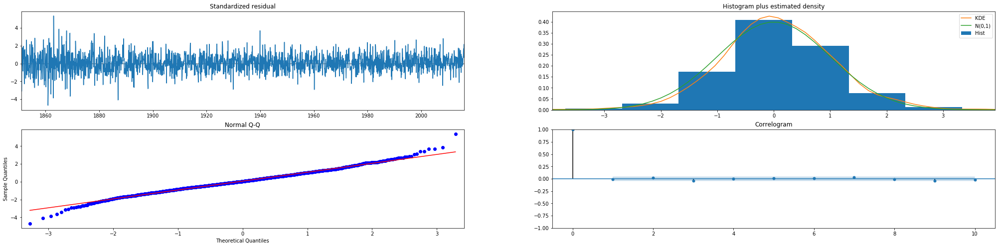

In [39]:
# generate model diagnostics
results.plot_diagnostics(figsize=(35,8))
plt.show()

The model diagnostics illustrated above suggested that the ARIMAX model residuals are normally distributed. The *orange* KDE lines are closely together with the *N(0,1)* line as shown in the top-right plot. The **N(0,1)** is the standard notation for a normal distribution with a mean 0 and a standard deviation of 1. The ordered distribution of residuals represented by *blue dots* shown in the bottom-left plot follows the linear trend of the samples taken from a standard normal distribution. The bottom-right plot shows that the time series residuals have a low correlation with its lagged versions.

Residuals are useful to check whether a model has adequately captured the information in the data. The properties of uncorrelated residuals and zero mean residuals indicates a good forecasting method.

Reference: [Residual Diagnostics](https://otexts.com/fpp2/residuals.html)

#### Validating Forecast

In [178]:
# prediction start from 2001
pred = results.get_prediction(start=pd.to_datetime('2000-01-01'), end=pd.to_datetime('2015-12-01'), dynamic=False)
pred_ci = pred.conf_int()

# display first 5 rows
display(pred_ci.head(5))

,lower LandAndOceanAverageTemperature,upper LandAndOceanAverageTemperature
2000-01-01,13.687,14.141
2000-02-01,13.876,14.330
2000-03-01,14.572,15.026
2000-04-01,15.426,15.880
2000-05-01,16.230,16.685


In [179]:
# mean squared error
forecasted = pred.predicted_mean.values
truth = list(itertools.chain.from_iterable(X['2000':'2015-12-01'].values))  # flatten nested list

mse = mean_squared_error(truth, forecasted)
print('The MSE of ARIMA SARIMAX model: {}'.format(mse))
print('The RMSE of ARIMA SARIMAX model: {}'.format(np.sqrt(mse)))

The MSE of ARIMA SARIMAX model: 0.010326258494776993
The RMSE of ARIMA SARIMAX model: 0.10161819962377307


In [185]:
# visualize the one-step ahead forecast
# observed and predicted
plot_ob = pgo.Scatter(x=X['1950':].index, y=X['1950':]['LandAndOceanAverageTemperature'].values, mode='lines', name='observed', line=dict(color='#%02x%02x%02x' % (57, 106, 177)))
pred_fc = pred.predicted_mean
plot_fc = pgo.Scatter(x=pred_fc.index, y=pred_fc.values, mode='lines', name='one-step ahead forecast', line=dict(color='#%02x%02x%02x' % (204, 37, 41)), opacity=0.7)

# append to data
data = []
data.append(plot_ob)
data.append(plot_fc)

# title and legend name
title = 'Global Land and Ocean Average Temperature Forecast Validation (Monthly)'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date', tick0=0))

# plot
iplot(pgo.Figure(data=data,layout=layout))

In [186]:
# forecasts temperature until 2020 december 
fc = results.get_forecast(pd.to_datetime('2020-12-01'))
fc_mean = fc.predicted_mean['2016':]

# forecast confidence interval
fc_ci = fc.conf_int()

# convert to pandas dataframe
fc_pandas = {'date': fc_mean.index, 'ForecastedLandAndOceanAverageTemperature': fc_mean.values, 'ForecastedLandAndOceanAverageTemperatureLower': fc_ci.ix[:,0].values, 'ForecastedLandAndOceanAverageTemperatureUpper': fc_ci.ix[:,1].values}
fc_pandas = pd.DataFrame(fc_pandas).set_index('date')

# display first 5 rows
display(fc_pandas)

,ForecastedLandAndOceanAverageTemperature,ForecastedLandAndOceanAverageTemperatureLower,ForecastedLandAndOceanAverageTemperatureUpper
date,,,
2016-01-01,14.462,14.235,14.689
2016-02-01,14.669,14.411,14.926
2016-03-01,15.287,15.015,15.559
2016-04-01,16.120,15.839,16.402
2016-05-01,16.862,16.572,17.151
2016-06-01,17.454,17.157,17.750
2016-07-01,17.719,17.416,18.022
2016-08-01,17.634,17.325,17.943
2016-09-01,17.034,16.719,17.349


In [190]:
# visualize observed and forecasted value without aggregating the mean
data = []

# observed: 1950 to 2015
data.append(pgo.Scatter(x=X['1950':].index, y=X['1950':]['LandAndOceanAverageTemperature'].values, name='observed', mode='lines', line=dict(color='#%02x%02x%02x' % (57, 106, 177))))

# forecast: to 2020
data.append(pgo.Scatter(x=fc_pandas.index, y=fc_pandas['ForecastedLandAndOceanAverageTemperature'].values, name='forecast', mode='lines', line=dict(color='#%02x%02x%02x' % (204, 37, 41), width=4)))
data.append(pgo.Scatter(x=fc_pandas.index, y=fc_pandas['ForecastedLandAndOceanAverageTemperatureLower'].values, name='forecast upper limit', mode='lines', fill=None, line=dict(color='#%02x%02x%02x' % (220, 220, 220)), opacity=0.1))
data.append(pgo.Scatter(x=fc_pandas.index, y=fc_pandas['ForecastedLandAndOceanAverageTemperatureUpper'].values, name='forecast lower limit', mode='lines', fill='tonexty', line=dict(color='#%02x%02x%02x' % (220, 220, 220)), opacity=0.1))

# title and legend name
title = 'Forecast of Global Land and Ocean Average Temperature (2016 - 2020)'
layout = pgo.Layout(title=pgo.layout.Title(text=title, xref='paper', xanchor="auto"),
                    yaxis=pgo.layout.YAxis(title=pgo.layout.yaxis.Title(text='Temperature (°C)')),
                    xaxis=pgo.layout.XAxis(title=pgo.layout.xaxis.Title(text='Date'), rangeslider=dict(visible=True), type='date', tick0=0))

# plot
iplot(pgo.Figure(data=data,layout=layout))